In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [2]:
data = pd.read_csv("/content/data2b.csv")
data.sample(8)

,IG,SMR_resp,Easting,Northing,pm10,Area,income_deprived,JSA_perc,Price_median,Sales,Band_AC,Band_FH,ethnic_perc,total_crime
704,S02000705,1.008632,254203.76360,669334.1521,14.1,134.0743,19.7,2.775,105000,256,61.145,0.130,7.51,490
764,S02000765,1.428288,336441.92490,950275.4361,11.6,158.8715,18.7,5.025,46000,63,88.273,0.586,2.20,1136
296,S02000297,1.013147,338787.49510,673198.5039,14.2,1154.7411,14.6,1.750,120000,121,70.577,13.221,1.88,714
430,S02000431,0.714533,78687.46467,830313.2692,8.7,38677.4170,13.9,4.250,47750,24,83.401,0.466,0.78,102
1152,S02001153,0.740746,264007.50830,660313.1107,14.1,114.8910,10.0,1.350,66526,84,38.992,32.573,2.66,451
888,S02000889,0.677277,288328.40860,659623.9766,13.4,120.8226,18.4,3.625,57275,79,85.146,1.425,0.00,1030
19,S02000020,0.783188,390297.61550,806400.1908,13.4,116.8891,15.3,1.825,58000,115,77.021,14.096,4.21,579
66,S02000067,0.846156,373285.42000,816280.5099,11.6,149.1184,9.9,1.125,87128,94,62.432,13.581,2.01,459


In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1235 entries, 0 to 1234
Data columns (total 14 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   IG               1235 non-null   object 
 1   SMR_resp         1235 non-null   float64
 2   Easting          1235 non-null   float64
 3   Northing         1235 non-null   float64
 4   pm10             1235 non-null   float64
 5   Area             1235 non-null   float64
 6   income_deprived  1235 non-null   float64
 7   JSA_perc         1235 non-null   float64
 8   Price_median     1235 non-null   int64  
 9   Sales            1235 non-null   int64  
 10  Band_AC          1235 non-null   float64
 11  Band_FH          1235 non-null   float64
 12  ethnic_perc      1235 non-null   float64
 13  total_crime      1235 non-null   int64  
dtypes: float64(10), int64(3), object(1)
memory usage: 135.2+ KB


In [4]:
data.describe().style.background_gradient(axis=1,cmap=sns.light_palette('red', as_cmap=True))

,SMR_resp,Easting,Northing,pm10,Area,income_deprived,JSA_perc,Price_median,Sales,Band_AC,Band_FH,ethnic_perc,total_crime
count,1235.000000,1235.000000,1235.000000,1235.000000,1235.000000,1235.000000,1235.000000,1235.000000,1235.000000,1235.000000,1235.000000,1235.000000,1235.000000
mean,0.774381,293835.649087,700701.641884,12.899757,6315.117066,13.893198,2.810223,96251.721457,127.016194,62.489275,11.919997,4.200858,533.936842
std,0.283219,51333.444375,80838.499467,1.757418,22482.317513,9.176392,1.783880,46937.601427,65.243104,26.745812,15.175772,7.063262,455.314846
min,0.139515,78687.464670,546412.486100,8.400000,19.313100,1.400000,0.250000,11700.000000,8.000000,0.072000,0.000000,0.000000,34.000000
25%,0.556622,257213.810600,661017.169750,11.600000,105.130400,7.000000,1.437500,62500.000000,85.000000,43.351000,1.417000,1.160000,255.500000
50%,0.724521,287034.766900,672572.649400,13.100000,173.423100,11.400000,2.325000,84995.000000,113.000000,68.155000,6.032000,1.960000,436.000000
75%,0.940946,327451.868650,711411.886700,14.100000,1250.989300,19.000000,3.700000,119917.000000,150.000000,84.999500,16.473000,3.790000,683.000000
max,1.999165,450391.615300,1191720.057000,19.300000,300603.322900,54.800000,11.775000,371777.000000,506.000000,100.000000,91.625000,80.520000,8841.000000


In [5]:
!pip install pywedge

In [6]:
import pywedge as pw
dash = pw.Pywedge_Charts(data, c=None, y='SMR_resp')
dashboard = dash.make_charts()

HTML(value='<h2>Pywedge Make_Charts </h2>')

In [7]:
 !pip3 install pandas_profiling --upgrade

Requirement already up-to-date: pandas_profiling in /usr/local/lib/python3.7/dist-packages (3.0.0)


In [8]:
import pandas_profiling as pp
from pandas_profiling import ProfileReport
pp.ProfileReport(data)

Summarize dataset:   0%|          | 0/27 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [5]:
from sklearn.preprocessing import MinMaxScaler, StandardScaler
## CODE HERE
data['SMR_resp'] = MinMaxScaler().fit_transform(data['SMR_resp'].values.reshape(len(data), 1))
data['Northing'] = MinMaxScaler().fit_transform(data['Northing'].values.reshape(len(data), 1))
data['pm10'] = MinMaxScaler().fit_transform(data['pm10'].values.reshape(len(data), 1))
data['JSA_perc'] = MinMaxScaler().fit_transform(data['JSA_perc'].values.reshape(len(data), 1))
data['ethnic_perc'] = MinMaxScaler().fit_transform(data['ethnic_perc'].values.reshape(len(data), 1))

In [6]:
data['log_Easting']=np.log10(data['Easting'])
data['log_Income']=np.log10(data['income_deprived'])
data['log_Price_median']=np.log10(data['Price_median'])
data['log_Sales']=np.log10(data['Sales'])
data['log_Band_AC']=np.log10(data['Band_AC'])
data['log_Band_FH']=np.log10(data['Band_FH'])
data['log_total_crime']=np.log10(data['total_crime'])

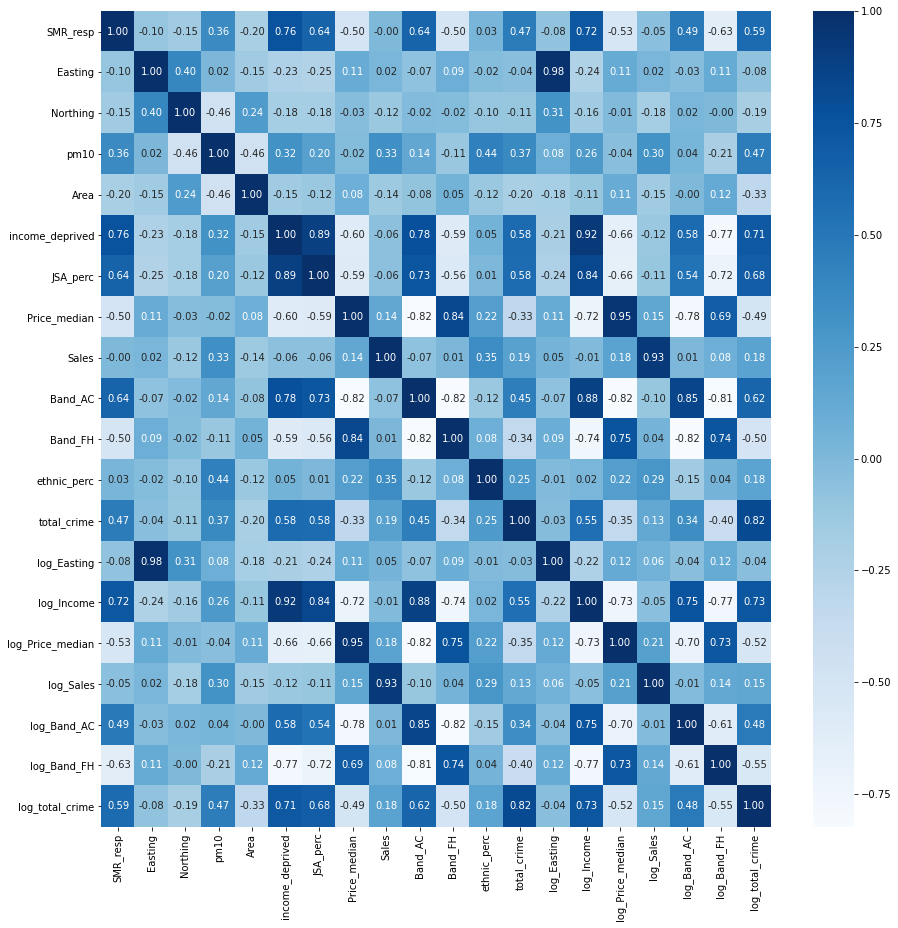

In [7]:
#cek korelasi antar feature
plt.figure(figsize=(15, 15))
sns.heatmap(data.corr(), cmap='Blues', annot=True, fmt='.2f')

In [12]:
data.columns

Index(['IG', 'SMR_resp', 'Easting', 'Northing', 'pm10', 'Area',
       'income_deprived', 'JSA_perc', 'Price_median', 'Sales', 'Band_AC',
       'Band_FH', 'ethnic_perc', 'total_crime', 'log_Easting', 'log_Income',
       'log_Price_median', 'log_Sales', 'log_Band_AC', 'log_Band_FH',
       'log_total_crime'],
      dtype='object')

In [7]:
X = data.drop(['IG','SMR_resp','log_Band_FH','total_crime','log_Band_AC','Sales',
               'Price_median','log_Easting','log_Income'], axis = 1)
y = data['SMR_resp']

In [8]:
#Splitting the data into Train and Test
from sklearn.model_selection import train_test_split
Xtrain, Xtest, ytrain, ytest = train_test_split(X,y,test_size=0.2, random_state=75)

In [9]:
data.describe()

,SMR_resp,Easting,Northing,pm10,Area,income_deprived,JSA_perc,Price_median,Sales,Band_AC,Band_FH,ethnic_perc,total_crime,log_Easting,log_Income,log_Price_median,log_Sales,log_Band_AC,log_Band_FH,log_total_crime
count,1235.000000,1235.000000,1235.000000,1235.000000,1235.000000,1235.000000,1235.000000,1235.000000,1235.000000,1235.000000,1235.000000,1235.000000,1235.000000,1235.000000,1235.000000,1235.000000,1235.000000,1235.000000,1235.000000,1235.000000
mean,0.341390,293835.649087,0.239094,0.412822,6315.117066,13.893198,0.222145,96251.721457,127.016194,62.489275,11.919997,0.052172,533.936842,5.461060,1.045157,4.936179,2.055244,1.714979,-inf,2.620801
std,0.152297,51333.444375,0.125271,0.161231,22482.317513,9.176392,0.154784,46937.601427,65.243104,26.745812,15.175772,0.087721,455.314846,0.080328,0.304416,0.203170,0.205353,0.354615,NaN,0.306621
min,0.000000,78687.464670,0.000000,0.000000,19.313100,1.400000,0.000000,11700.000000,8.000000,0.072000,0.000000,0.000000,34.000000,4.895906,0.146128,4.068186,0.903090,-1.142668,-inf,1.531479
25%,0.224293,257213.810600,0.177597,0.293578,105.130400,7.000000,0.103037,62500.000000,85.000000,43.351000,1.417000,0.014406,255.500000,5.410294,0.845098,4.795880,1.929419,1.636999,0.151363,2.407390
50%,0.314579,287034.766900,0.195504,0.431193,173.423100,11.400000,0.180043,84995.000000,113.000000,68.155000,6.032000,0.024342,436.000000,5.457935,1.056905,4.929393,2.053078,1.833498,0.780461,2.639486
75%,0.430958,327451.868650,0.255691,0.522936,1250.989300,19.000000,0.299349,119917.000000,150.000000,84.999500,16.473000,0.047069,683.000000,5.515147,1.278754,5.078881,2.176091,1.929416,1.216773,2.834420
max,1.000000,450391.615300,1.000000,1.000000,300603.322900,54.800000,1.000000,371777.000000,506.000000,100.000000,91.625000,1.000000,8841.000000,5.653590,1.738781,5.570283,2.704151,2.000000,1.962014,3.946501


In [10]:
#Fitting simple randomforest to the Training Set
from  sklearn.ensemble import RandomForestRegressor
regressor = RandomForestRegressor()
regressor.fit(Xtrain, ytrain)
pred = regressor.predict(Xtest)
regressor.score(Xtest, ytest)#liat skor data test

0.6314456825266022

In [11]:
from sklearn import metrics
from sklearn.metrics import mean_squared_error, mean_absolute_error, confusion_matrix
print('tabel error randomforest : ')
print('Mean Absolute Error      : ', metrics.mean_absolute_error(ytest, pred))
print('Mean Squared  Error      : ', metrics.mean_squared_error(ytest, pred))
print('Root Mean Squared  Error : ', np.sqrt(metrics.mean_squared_error(ytest, pred)))
print('R Squared Error          : ', metrics.r2_score(ytest, pred))
# Explained variance score: 1 is perfect prediction
from sklearn.metrics import r2_score
print('Variance score           :  %.2f' % r2_score(ytest, pred))

tabel error randomforest : 
Mean Absolute Error      :  0.07859207613762145
Mean Squared  Error      :  0.01011240794047854
Root Mean Squared  Error :  0.10056046907447548
R Squared Error          :  0.6314456825266022
Variance score           :  0.63


In [12]:
from sklearn.linear_model import LinearRegression 
regressor1 = LinearRegression()
regressor1.fit(Xtrain, ytrain)
pred1 = regressor1.predict(Xtest)
regressor1.score(Xtest, ytest)#skor untuk linear regresi

0.6419621423265369

In [13]:
from sklearn import metrics
from sklearn.metrics import mean_squared_error, mean_absolute_error, confusion_matrix
print('tabel error linear regression : ')
print('Mean Absolute Error      : ', metrics.mean_absolute_error(ytest, pred1))
print('Mean Squared  Error      : ', metrics.mean_squared_error(ytest, pred1))
print('Root Mean Squared  Error : ', np.sqrt(metrics.mean_squared_error(ytest, pred1)))
print('R Squared Error          : ', metrics.r2_score(ytest, pred1))
# Explained variance score: 1 is perfect prediction
from sklearn.metrics import r2_score
print('Variance score           :  %.2f' % r2_score(ytest, pred1))

tabel error linear regression : 
Mean Absolute Error      :  0.07780277059806745
Mean Squared  Error      :  0.009823856900524272
Root Mean Squared  Error :  0.09911537166617634
R Squared Error          :  0.6419621423265369
Variance score           :  0.64
